# Bitcoin Price Prediction using LSTM Neural Network model

Based on: https://github.com/jackmin97/Cryptocurrencies-Price-Prediction-using-LSTM-Neural-Network-model/

`pip install -r requirements.txt`

#### Steps for performing Bitcoin Price Prediction :
* Import necessary Libraries
* Load dataset
* Visualize the data to explore the trend in the data.
* Split the dataset into training and testing data.(Since Bitcoin price has drastically flucated from 200 dollar in 2014 to 15000 dollar in 2018, from 3000 dollar in year 2019 to 69000 dollar in 2021, we will just consider data from January 2021 to avoid this type of fluctuation. As we want to predict Close Price of Bitcoin, we are just considering Close and Date.
* Building LSTM Model
* Fitting the training data
* Prediction on testing data
* Model Evaluation (Calculate RMSE,MSE,MAE,R2 score)
* Hyperparameter tunning
* Prediction for n days 

## 1. Import libraries

In [28]:
import LSTM_model_builder as model_builder
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as p
from itertools import cycle

## 2. Loading Dataset

In [29]:
# load hourly market data (also works with daily data)
maindf = model_builder.load_dataset('datasets/BTC-Hourly-Binance.csv')

Total number of rows present in the dataset: 47076
Total number of columns present in the dataset: 11
Starting date: 2017-08-17 04:00:00 (1502942400000)
Ending date:   2023-01-06 21:00:00 (1673038800000)


In [30]:
maindf.shape

(47076, 11)

In [31]:
maindf.head()

,open_time,close_time,symbol,open,high,low,close,volume,quote_asset_volume,open_date,close_date
0,1502942400000,1502945999999,BTC/USDT,4261.48,4313.62,4261.32,4308.83,47.181009,202366.138393,2017-08-17 04:00:00,2017-08-17 04:59:59.999
1,1502946000000,1502949599999,BTC/USDT,4308.83,4328.69,4291.37,4315.32,23.234916,100304.823567,2017-08-17 05:00:00,2017-08-17 05:59:59.999
2,1502949600000,1502953199999,BTC/USDT,4330.29,4345.45,4309.37,4324.35,7.229691,31282.312670,2017-08-17 06:00:00,2017-08-17 06:59:59.999
3,1502953200000,1502956799999,BTC/USDT,4316.62,4349.99,4287.41,4349.99,4.443249,19241.058300,2017-08-17 07:00:00,2017-08-17 07:59:59.999
4,1502956800000,1502960399999,BTC/USDT,4333.32,4377.85,4333.32,4360.69,0.972807,4239.503586,2017-08-17 08:00:00,2017-08-17 08:59:59.999


In [32]:
maindf.tail()

,open_time,close_time,symbol,open,high,low,close,volume,quote_asset_volume,open_date,close_date
47071,1673024400000,1673027999999,BTC/USDT,16827.21,16845.78,16811.63,16821.27,8080.32447,1.359439e+08,2023-01-06 17:00:00,2023-01-06 17:59:59.999
47072,1673028000000,1673031599999,BTC/USDT,16821.58,16864.15,16821.12,16850.45,9135.64548,1.539120e+08,2023-01-06 18:00:00,2023-01-06 18:59:59.999
47073,1673031600000,1673035199999,BTC/USDT,16850.64,16965.41,16845.00,16939.91,14143.93623,2.390632e+08,2023-01-06 19:00:00,2023-01-06 19:59:59.999
47074,1673035200000,1673038799999,BTC/USDT,16940.41,17041.00,16886.21,16897.48,15953.02164,2.706229e+08,2023-01-06 20:00:00,2023-01-06 20:59:59.999
47075,1673038800000,1673042399999,BTC/USDT,16897.96,16915.58,16889.27,16903.03,1766.62906,2.986067e+07,2023-01-06 21:00:00,2023-01-06 21:59:59.999


In [33]:
maindf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47076 entries, 0 to 47075
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   open_time           47076 non-null  int64         
 1   close_time          47076 non-null  int64         
 2   symbol              47076 non-null  object        
 3   open                47076 non-null  float64       
 4   high                47076 non-null  float64       
 5   low                 47076 non-null  float64       
 6   close               47076 non-null  float64       
 7   volume              47076 non-null  float64       
 8   quote_asset_volume  47076 non-null  float64       
 9   open_date           47076 non-null  datetime64[ns]
 10  close_date          47076 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(6), int64(2), object(1)
memory usage: 4.0+ MB


In [34]:
maindf.describe()

,open_time,close_time,open,high,low,close,volume,quote_asset_volume
count,4.707600e+04,4.707600e+04,47076.000000,47076.000000,47076.000000,47076.000000,47076.000000,4.707600e+04
mean,1.588086e+12,1.588090e+12,19427.984443,19539.252004,19309.468954,19428.215862,2862.703555,6.113622e+07
std,4.909883e+10,4.909883e+10,16711.289751,16806.450744,16610.515363,16711.182635,3759.273478,9.099307e+07
min,1.502942e+12,1.502946e+12,2870.900000,2950.000000,2817.000000,2919.000000,0.000000,0.000000e+00
25%,1.545594e+12,1.545598e+12,7307.397500,7340.000000,7271.770000,7307.117500,996.258316,8.562161e+06
50%,1.588138e+12,1.588142e+12,10604.105000,10667.250000,10541.595000,10604.100000,1714.614553,2.296772e+07
75%,1.630621e+12,1.630624e+12,31255.105000,31529.470000,30917.447500,31254.722500,3209.964438,8.325950e+07
max,1.673039e+12,1.673042e+12,68635.120000,69000.000000,68451.190000,68633.690000,137207.188600,3.005634e+09


## 3. EDA (Explanatory Data Analysis)

### Overall Analisys from 2017 to 2023

In [35]:
y_overall = maindf.loc[(maindf['open_date'] >= '2017-01-01') & (maindf['open_date'] < '2024-01-01')]

# drop unnecessary columns from visulazation
y_overall.drop(y_overall[['quote_asset_volume','volume', 'symbol']],axis=1)

,open_time,close_time,open,high,low,close,open_date,close_date
0,1502942400000,1502945999999,4261.48,4313.62,4261.32,4308.83,2017-08-17 04:00:00,2017-08-17 04:59:59.999
1,1502946000000,1502949599999,4308.83,4328.69,4291.37,4315.32,2017-08-17 05:00:00,2017-08-17 05:59:59.999
2,1502949600000,1502953199999,4330.29,4345.45,4309.37,4324.35,2017-08-17 06:00:00,2017-08-17 06:59:59.999
3,1502953200000,1502956799999,4316.62,4349.99,4287.41,4349.99,2017-08-17 07:00:00,2017-08-17 07:59:59.999
4,1502956800000,1502960399999,4333.32,4377.85,4333.32,4360.69,2017-08-17 08:00:00,2017-08-17 08:59:59.999
...,...,...,...,...,...,...,...,...
47071,1673024400000,1673027999999,16827.21,16845.78,16811.63,16821.27,2023-01-06 17:00:00,2023-01-06 17:59:59.999
47072,1673028000000,1673031599999,16821.58,16864.15,16821.12,16850.45,2023-01-06 18:00:00,2023-01-06 18:59:59.999
47073,1673031600000,1673035199999,16850.64,16965.41,16845.00,16939.91,2023-01-06 19:00:00,2023-01-06 19:59:59.999
47074,1673035200000,1673038799999,16940.41,17041.00,16886.21,16897.48,2023-01-06 20:00:00,2023-01-06 20:59:59.999


In [36]:
monthwise= y_overall.groupby(y_overall['open_date'].dt.strftime('%B'))[['open','close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,open,close
open_date,,
January,19981.802832,19980.460542
February,21929.786262,21934.676965
March,23307.544213,23310.229960
April,23763.404107,23762.608582
May,20781.405851,20774.858044
June,17217.649919,17213.943470
July,16608.411650,16611.623847
August,18052.765941,18053.237367
September,16170.353936,16168.753435


In [37]:
names = cycle(['BTC Open Price','BTC Close Price','BTC High Price','BTC Low Price'])

fig = px.line(y_overall, x=y_overall.open_date, y=[y_overall['open'],y_overall['close'],y_overall['high'], y_overall['low']],labels={'open_date': 'Date','value':'Bitcoin value'})
fig.update_layout(title_text='Bitcoin chart from 2017-08-17 to 2023-01-06', font_size=15, font_color='black',legend_title_text='BTC Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

## 4. Building LSTM model

* First step is preparing Data for Training and Testing
* Here we are just considering the period from 2021-01-01 to 2023-01-06 for training data
  * Since Bitcoin price has drastically flucated from 200 dollar in year 2014 to 15000 dollar in year 2018 to 3000 dollar in year 2019, so we will just consider data from January 2021 to avoid this type of fluctuation. 
* As we want to predict Close Price of Bitcoin, we are just considering Close and Date.

### Take data from 2021-01-01 to today

In [38]:
closedf = model_builder.get_prediction_dataframe(maindf)
close_stock = closedf.copy()
print("Total data for prediction: ",closedf.shape[0])

Shape of prediction dataframe: (17630, 2)
Total data for prediction:  17630


In [39]:
closedf
close_stock

,open_date,close
29446,2021-01-01 01:00:00,29409.99
29447,2021-01-01 02:00:00,29194.65
29448,2021-01-01 03:00:00,29278.40
29449,2021-01-01 04:00:00,29220.31
29450,2021-01-01 05:00:00,29187.01
...,...,...
47071,2023-01-06 17:00:00,16821.27
47072,2023-01-06 18:00:00,16850.45
47073,2023-01-06 19:00:00,16939.91
47074,2023-01-06 20:00:00,16897.48


In [40]:
fig = px.line(closedf, x=closedf.open_date, y=closedf.close,labels={'open_date':'Date','close':'Close Bitcoin'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Considered period to predict Bitcoin close price', plot_bgcolor='white', font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Normalizing Data

* Normalization is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric columns in the dataset to use a common scale, without distorting differences in the ranges of values or losing information.
* MinMaxScaler. For each value in a feature, MinMaxScaler subtracts the minimum value in the feature and then divides by the range. The range is the difference between the original maximum and original minimum. MinMaxScaler preserves the shape of the original distribution.

In [41]:
closedf = model_builder.normalize(closedf)

Shape after normalization: (17630, 1)


### Slicing Data into Training and Testing set

In [42]:
train_data, test_data = model_builder.split_dataset(closedf)

Train data shape:  (12341, 1)
Test data shape:  (5289, 1)


### Now we Transform the Close price based on Time-series-analysis forecasting requirement. Here we will take 15 steps

In [43]:
time_step = 15
X_train, y_train = model_builder.create_dataset_matrix(train_data, time_step)
X_test, y_test = model_builder.create_dataset_matrix(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (12325, 15)
y_train:  (12325,)
X_test:  (5273, 15)
y_test (5273,)


In [44]:
# Reshape input to be [samples, time steps, features] which is required for LSTM

X_train = model_builder.normalize_lstm(X_train)
X_test = model_builder.normalize_lstm(X_test)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (12325, 15, 1)
X_test:  (5273, 15, 1)


### Actual Model Building

In [45]:
model = model_builder.create_model()

In [46]:
history = model_builder.train_model(model, X_train, y_train, X_test, y_test)

Epoch 1/200
386/386 [==============================] - 4s 7ms/step - loss: 0.0476 - val_loss: 0.0374
Epoch 2/200
386/386 [==============================] - 3s 6ms/step - loss: 0.0108 - val_loss: 0.0315
Epoch 3/200
386/386 [==============================] - 3s 7ms/step - loss: 0.0098 - val_loss: 0.0239
Epoch 4/200
386/386 [==============================] - 3s 7ms/step - loss: 0.0089 - val_loss: 0.0207
Epoch 5/200
386/386 [==============================] - 3s 7ms/step - loss: 0.0083 - val_loss: 0.0157
Epoch 6/200
386/386 [==============================] - 2s 6ms/step - loss: 0.0078 - val_loss: 0.0115
Epoch 7/200
386/386 [==============================] - 3s 7ms/step - loss: 0.0078 - val_loss: 0.0125
Epoch 8/200
386/386 [==============================] - 3s 7ms/step - loss: 0.0073 - val_loss: 0.0123
Epoch 9/200
386/386 [==============================] - 3s 8ms/step - loss: 0.0069 - val_loss: 0.0109
Epoch 10/200
386/386 [==============================] - 3s 7ms/step - loss: 0.0068 - val_lo

### Plotting Loss vs Validation loss

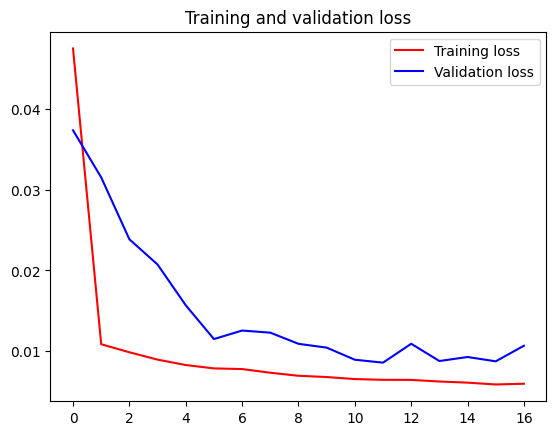

<Figure size 640x480 with 0 Axes>

In [47]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()


plt.show()

In [48]:
# use the model to predict values based on the trained data
train_predict = model.predict(X_train)
print("predictions trained shape: ", train_predict.shape)

# use the model predict values based on (unseen) testing data
test_predict = model.predict(X_test)
print("predictions test shape:", test_predict.shape)

predictions trained shape:  (12325, 1)
predictions test shape: (5273, 1)


## Model Evaluation

In [49]:
# transform back to original form
train_predict = model_builder.unnormalize(train_predict)
test_predict = model_builder.unnormalize(test_predict)

# print performance metrics
model_builder.evaluate_performance(train_predict, test_predict, y_train, y_test)

Train data RMSE:  429.47052095837995
Train data MSE:  184444.92837226225
Train data MAE:  290.54597854969575
-------------------------------------------------------------------------------------
Test data RMSE:  608.7091952456223
Test data MSE:  370526.884376573
Test data MAE:  564.2683100523896
Train data explained variance regression score: 0.9979148095501555
Test data explained variance regression score: 0.9941745526763017
Train data R2 score: 0.9979041472398066
Test data R2 score: 0.9639806861791855
Train data MGD:  0.00010161744842102537
Test data MGD:  0.0010300144304611373
----------------------------------------------------------------------
Train data MPD:  4.23594086742499
Test data MPD:  19.42104467307437


## Comparision of original Bitcoin close price and Predicted close price

In [50]:
# shift train predictions for plotting
look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'open_date': close_stock['open_date'],
                       'original_close': close_stock['close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['open_date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Bitcoin price','open_date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (17630, 1)
Test predicted data:  (17630, 1)


### Predicting next 30 days

In [51]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days of dataset and next predicted 30 days

In [52]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
[16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39
 40 41 42 43 44 45]


In [53]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = model_builder.scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = model_builder.scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Bitcoin price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting entire Closing Bitcoin Price with next 30 days period of prediction

In [54]:
lstmdf=closedf.tolist()
lstmdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
lstmdf=model_builder.scaler.inverse_transform(lstmdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(lstmdf,labels={'value': 'Bitcoin price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing Bitcoin price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Bitcoin')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()